In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
vivovinco_20212022_football_team_stats_path = kagglehub.dataset_download('vivovinco/20212022-football-team-stats')
vivovinco_20212022_football_player_stats_path = kagglehub.dataset_download('vivovinco/20212022-football-player-stats')
vivovinco_20222023_football_player_stats_path = kagglehub.dataset_download('vivovinco/20222023-football-player-stats')
vivovinco_20222023_football_team_stats_path = kagglehub.dataset_download('vivovinco/20222023-football-team-stats')

print('Data source import complete.')


Data source import complete.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import pandas as pd

# Load datasets
player_data_2021 = pd.read_csv("/content/2021-2022 Football Player Stats.csv",encoding='latin-1', delimiter=';')
team_data_2021 = pd.read_csv("/content/2021-2022 Football Team Stats.csv",encoding='latin-1', delimiter=';')
player_data_2022 = pd.read_csv("/content/2022-2023 Football Player Stats.csv",encoding='latin-1', delimiter=';')
team_data_2022 = pd.read_csv("/content/2022-2023 Football Team Stats.csv",encoding='latin-1', delimiter=';')


## General EDA

In [ ]:
print("Player data 2021 shape: ", player_data_2021.shape)
print("Player data 2022 shape: ", player_data_2022.shape)
print("Team data 2021 shape: ", team_data_2021.shape)
print("Team data 2021 shape: ", team_data_2022.shape)

Player data 2021 shape:  (2921, 143)
Player data 2022 shape:  (2689, 124)
Team data 2021 shape:  (98, 20)
Team data 2021 shape:  (98, 20)


In [ ]:
player_data_2021.head()

,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,...,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
0,1,Max Aarons,ENG,DF,Norwich City,Premier League,22.0,2000,34,32,...,0.03,1.41,1.16,0.0,0.06,0.03,5.53,0.47,1.59,22.7
1,2,Yunis Abdelhamid,MAR,DF,Reims,Ligue 1,34.0,1987,34,34,...,0.00,0.06,1.39,0.0,0.03,0.00,6.77,2.02,1.36,59.8
2,3,Salis Abdul Samed,GHA,MF,Clermont Foot,Ligue 1,22.0,2000,31,29,...,0.00,0.36,1.24,0.0,0.00,0.00,8.76,0.88,0.88,50.0
3,4,Laurent Abergel,FRA,MF,Lorient,Ligue 1,29.0,1993,34,34,...,0.03,0.79,2.23,0.0,0.00,0.00,8.87,0.43,0.43,50.0
4,5,Charles Abi,FRA,FW,Saint-Étienne,Ligue 1,22.0,2000,1,1,...,0.00,2.00,0.00,0.0,0.00,0.00,4.00,2.00,0.00,100.0


In [ ]:
team_data_2021.head()

,Rk,Squad,Country,LgRk,MP,W,D,L,GF,GA,GD,Pts,Pts/G,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper
0,1,Manchester City,ENG,1,38,29,6,3,99,26,73,93,2.45,89.0,27.2,61.9,1.63,52774,Kevin De Bruyne - 15,Ederson
1,2,Liverpool,ENG,2,38,28,8,2,94,26,68,92,2.42,89.2,34.2,55.0,1.45,53367,Mohamed Salah - 23,Alisson
2,3,Bayern Munich,GER,1,34,24,5,5,97,37,60,77,2.26,88.1,37.1,51.0,1.50,33176,Robert Lewandowski - 35,Manuel Neuer
3,4,Paris S-G,FRA,1,38,26,8,4,90,36,54,86,2.26,76.5,38.6,37.9,1.00,41188,Kylian Mbappé - 28,Keylor Navas
4,5,Real Madrid,ESP,1,38,26,8,4,80,31,49,86,2.26,74.3,47.0,27.3,0.72,41235,Karim Benzema - 27,Thibaut Courtois


In [ ]:
team_data_2021.columns

Index(['Rk', 'Squad', 'Country', 'LgRk', 'MP', 'W', 'D', 'L', 'GF', 'GA', 'GD',
       'Pts', 'Pts/G', 'xG', 'xGA', 'xGD', 'xGD/90', 'Attendance',
       'Top Team Scorer', 'Goalkeeper'],
      dtype='object')

In [ ]:
# Check for duplicates in the teams data
duplicates = team_data_2021[team_data_2021.duplicated()]

# Print the duplicates
print("Number of duplicate rows:", duplicates.shape[0])
if not duplicates.empty:
    print("Duplicate rows:")
    duplicates
else:
    print("No duplicate rows found.")


Number of duplicate rows: 0
No duplicate rows found.


In [ ]:
player_data_2021.columns

Index(['Rk', 'Player', 'Nation', 'Pos', 'Squad', 'Comp', 'Age', 'Born', 'MP',
       'Starts',
       ...
       'Off', 'Crs', 'TklW', 'PKwon', 'PKcon', 'OG', 'Recov', 'AerWon',
       'AerLost', 'AerWon%'],
      dtype='object', length=143)

In [ ]:
player_data_2021['Pos'].unique()

array(['DF', 'MF', 'FW', 'MFFW', 'FWMF', 'GK', 'DFMF', 'FWDF', 'MFDF',
       'DFFW', 'GKMF'], dtype=object)

In [ ]:
# Modify the 'Pos' column to keep only the first two characters
player_data_2021['Pos'] = player_data_2021['Pos'].str[:2]

# Display the unique positions to verify the change
print(player_data_2021['Pos'].unique())


['DF' 'MF' 'FW' 'GK']


In [ ]:
# Modify the 'Pos' column to keep only the first two characters
player_data_2022['Pos'] = player_data_2022['Pos'].str[:2]

# Display the unique positions to verify the change
print(player_data_2022['Pos'].unique())


['MF' 'DF' 'FW' 'GK']


### Checking Null Values

In [ ]:
print("Null vaues in 2021 player data: ", player_data_2021.isnull().sum().sum())
# Display rows with null values in player_data_2021
player_data_2021[player_data_2021.isnull().any(axis=1)]


Null vaues in 2021 player data:  2


,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,...,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
1531,1532,Javier Llabrés,NaN,FW,Mallorca,La Liga,NaN,0,5,1,...,0.67,3.33,2.0,0.0,0.0,0.0,5.33,0.67,2.0,25.0


In [ ]:
print("Null vaues in 2022 player data: ", player_data_2022.isnull().sum().sum())
# Display rows with null values in player_data_2022
player_data_2022[player_data_2022.isnull().any(axis=1)]


Null vaues in 2022 player data:  1


,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,...,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
1875,1876,David Ozoh,NaN,FW,Crystal Palace,Premier League,17,2005,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Null vaues in 2021 team data: ", team_data_2021.isnull().sum().sum())
# Display rows with null values in player_data_2021
team_data_2021[team_data_2021.isnull().any(axis=1)]


Null vaues in 2021 team data:  0


,Rk,Squad,Country,LgRk,MP,W,D,L,GF,GA,GD,Pts,Pts/G,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper


In [ ]:
print("Null vaues in 2022 team data: ", team_data_2022.isnull().sum().sum())
# Display rows with null values in player_data_2021
team_data_2022[team_data_2022.isnull().any(axis=1)]


Null vaues in 2022 team data:  0


,Rk,Squad,Country,LgRk,MP,W,D,L,GF,GA,GD,Pts,Pts/MP,xG,xGA,xGD,xGD/90,Attendance,Top Team Scorer,Goalkeeper


In [ ]:
# import pandas as pd

# # Example: Load player data (assuming player_data is a DataFrame)
# # player_data = pd.read_csv("player_data.csv")

# # Replace with actual column names for grouping and numeric columns for aggregation
# group_columns = ['Squad', 'Pos']  # Group by team (Squad) and optionally position
# numeric_columns = [
#     'Goals', 'Assists', 'SCA', 'GCA', 'Tkl', 'Int', 'Blocks',
#     'PasTotCmp%', 'PasProg', 'PasTotPrgDist', 'AerWon', 'AerWon%',
#     'Fls', 'Fld', 'CarTotDist', 'CarPrgDist', 'Touches', 'DriSucc', 'Recov'
# ]  # Replace with actual columns from your dataset

# # Fill NaN values (optional: customize based on data quality)
# player_data_2021 = player_data_2021.fillna(0)

# # Aggregate data at the team level
# new_team_data = player_data_2021.groupby('Squad')[numeric_columns].agg({
#     'Goals': 'sum',
#     'Assists': 'sum',
#     'SCA': 'sum',
#     'GCA': 'sum',
#     'Tkl': 'sum',
#     'Int': 'sum',
#     'Blocks': 'sum',
#     'PasTotCmp%': 'mean',
#     'PasProg': 'sum',
#     'PasTotPrgDist': 'sum',
#     'AerWon': 'sum',
#     'AerWon%': 'mean',
#     'Fls': 'sum',
#     'Fld': 'sum',
#     'CarTotDist': 'sum',
#     'CarPrgDist': 'sum',
#     'Touches': 'sum',
#     'DriSucc': 'sum',
#     'Recov': 'sum',
# }).reset_index()

# # Print the aggregated team dataset
# new_team_data


In [ ]:
player_data_2021.dropna(axis = 1)

,Rk,Player,Pos,Squad,Comp,Born,MP,Starts,Min,90s,...,Off,Crs,TklW,PKwon,PKcon,OG,Recov,AerWon,AerLost,AerWon%
0,1,Max Aarons,DF,Norwich City,Premier League,2000,34,32,2881,32.0,...,0.03,1.41,1.16,0.00,0.06,0.03,5.53,0.47,1.59,22.7
1,2,Yunis Abdelhamid,DF,Reims,Ligue 1,1987,34,34,2983,33.1,...,0.00,0.06,1.39,0.00,0.03,0.00,6.77,2.02,1.36,59.8
2,3,Salis Abdul Samed,MF,Clermont Foot,Ligue 1,2000,31,29,2462,27.4,...,0.00,0.36,1.24,0.00,0.00,0.00,8.76,0.88,0.88,50.0
3,4,Laurent Abergel,MF,Lorient,Ligue 1,1993,34,34,2956,32.8,...,0.03,0.79,2.23,0.00,0.00,0.00,8.87,0.43,0.43,50.0
4,5,Charles Abi,FW,Saint-Étienne,Ligue 1,2000,1,1,45,0.5,...,0.00,2.00,0.00,0.00,0.00,0.00,4.00,2.00,0.00,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,2917,Martín Zubimendi,MF,Real Sociedad,La Liga,1999,36,26,2591,28.8,...,0.10,0.10,1.08,0.00,0.00,0.00,9.41,2.64,1.42,65.0
2917,2918,Szymon ?urkowski,MF,Empoli,Serie A,1997,35,29,2307,25.6,...,0.00,0.74,1.91,0.00,0.04,0.00,8.05,1.02,1.56,39.4
2918,2919,Martin Ødegaard,MF,Arsenal,Premier League,1998,36,32,2785,30.9,...,0.10,0.84,0.81,0.00,0.06,0.00,7.44,0.55,0.81,40.5
2919,2920,Milan ?uri?,FW,Salernitana,Serie A,1990,33,23,2165,24.1,...,0.25,0.29,0.17,0.04,0.00,0.00,3.24,12.40,4.81,72.0


In [ ]:
player_data_2021['Pos'].unique()

array(['DF', 'MF', 'FW', 'GK'], dtype=object)

In [ ]:
for i in player_data_2021.columns:
    print(i,end=" ")

Rk Player Nation Pos Squad Comp Age Born MP Starts Min 90s Goals Shots SoT SoT% G/Sh G/SoT ShoDist ShoFK ShoPK PKatt PasTotCmp PasTotAtt PasTotCmp% PasTotDist PasTotPrgDist PasShoCmp PasShoAtt PasShoCmp% PasMedCmp PasMedAtt PasMedCmp% PasLonCmp PasLonAtt PasLonCmp% Assists PasAss Pas3rd PPA CrsPA PasProg PasAtt PasLive PasDead PasFK TB PasPress Sw PasCrs CK CkIn CkOut CkStr PasGround PasLow PasHigh PaswLeft PaswRight PaswHead TI PaswOther PasCmp PasOff PasOut PasInt PasBlocks SCA ScaPassLive ScaPassDead ScaDrib ScaSh ScaFld ScaDef GCA GcaPassLive GcaPassDead GcaDrib GcaSh GcaFld GcaDef Tkl TklWon TklDef3rd TklMid3rd TklAtt3rd TklDri TklDriAtt TklDri% TklDriPast Press PresSucc Press% PresDef3rd PresMid3rd PresAtt3rd Blocks BlkSh BlkShSv BlkPass Int Tkl+Int Clr Err Touches TouDefPen TouDef3rd TouMid3rd TouAtt3rd TouAttPen TouLive DriSucc DriAtt DriSucc% DriPast DriMegs Carries CarTotDist CarPrgDist CarProg Car3rd CPA CarMis CarDis RecTarg Rec Rec% RecProg CrdY CrdR 2CrdY Fls Fld Off Crs 

In [ ]:
import pandas as pd

# Load player and team data
player_data = player_data_2021
team_data = team_data_2021

# Create a dictionary to store the aggregated stats for each team
team_aggregated_stats = {}

# Define the list of positions
# positions = ['GK', 'DF', 'MF', 'FW']
positions = player_data_2021['Pos'].unique()

# Loop over each team in the team data
for team in team_data['Squad'].unique():
    # Filter player data for this team
    team_players = player_data[player_data['Squad'] == team]

    # Initialize a dictionary to store the aggregated stats for this team
    team_stats = {}

    # Aggregating statistics for each position
    for pos in positions:
        pos_players = team_players[team_players['Pos'] == pos]

        # Aggregate stats for the position
        team_stats[f'{pos}_AerWon'] = pos_players['AerWon'].sum()
        team_stats[f'{pos}_Tkl'] = pos_players['Tkl'].sum()
        team_stats[f'{pos}_Int'] = pos_players['Int'].sum()
        team_stats[f'{pos}_Blk'] = pos_players['Blocks'].sum()
        team_stats[f'{pos}_PasTotCmp%'] = pos_players['PasTotCmp%'].mean()  # average pass completion %
        team_stats[f'{pos}_PasProg'] = pos_players['PasProg'].sum()
        team_stats[f'{pos}_CarProg'] = pos_players['CarProg'].sum()
        team_stats[f'{pos}_Goals'] = pos_players['Goals'].sum()
        team_stats[f'{pos}_Shots'] = pos_players['Shots'].sum()
        # team_stats[f'{pos}_DriSucc%'] = pos_players['DriSucc%'].mean()  # average dribble success %
        # team_stats[f'{pos}_Saves'] = pos_players['Saves'].sum()
        team_stats[f'{pos}_Recov'] = pos_players['Recov'].sum()
        team_stats[f'{pos}_PPA'] = pos_players['PPA'].sum()
        team_stats[f'{pos}_Assists'] = pos_players['Assists'].sum()
        team_stats[f'{pos}_G/Sh'] = pos_players['G/Sh'].mean()  # average goals per shot

    # Add the aggregated stats for the team
    team_aggregated_stats[team] = team_stats

# Convert the dictionary to a DataFrame
aggregated_team_2021 = pd.DataFrame.from_dict(team_aggregated_stats, orient='index')

# Display the aggregated team dataset
aggregated_team_2021.head()


,DF_AerWon,DF_Tkl,DF_Int,DF_Blk,DF_PasTotCmp%,DF_PasProg,DF_CarProg,DF_Goals,DF_Shots,DF_Recov,...,GK_Blk,GK_PasTotCmp%,GK_PasProg,GK_CarProg,GK_Goals,GK_Shots,GK_Recov,GK_PPA,GK_Assists,GK_G/Sh
Manchester City,18.77,13.83,10.51,7.54,90.988889,46.14,69.04,0.50,6.70,67.09,...,0.00,88.2,0.03,0.0,0.0,0.0,10.27,0.03,0.00,0.0
Liverpool,17.85,9.95,14.88,8.61,84.912500,40.48,64.03,0.36,5.83,76.18,...,0.03,88.3,0.00,0.0,0.0,0.0,11.72,0.00,0.03,0.0
Bayern Munich,17.36,25.28,21.03,20.77,87.820000,51.93,58.65,0.38,7.01,101.05,...,0.04,90.8,0.18,0.0,0.0,0.0,20.41,0.04,0.00,0.0
Paris S-G,20.36,17.65,14.02,23.43,93.618182,51.16,62.25,0.68,4.23,56.55,...,0.00,92.6,0.00,0.0,0.0,0.0,15.15,0.00,0.00,0.0
Real Madrid,10.36,18.40,21.65,15.50,89.754545,38.26,54.77,0.58,5.95,79.14,...,0.00,85.0,0.03,0.0,0.0,0.0,6.69,0.00,0.00,0.0


In [ ]:
import pandas as pd

# Load player and team data
player_data = player_data_2022
team_data = team_data_2022

# Create a dictionary to store the aggregated stats for each team
team_aggregated_stats = {}

# Define the list of positions
# positions = ['GK', 'DF', 'MF', 'FW']
positions = player_data_2022['Pos'].unique()

# Loop over each team in the team data
for team in team_data['Squad'].unique():
    # Filter player data for this team
    team_players = player_data[player_data['Squad'] == team]

    # Initialize a dictionary to store the aggregated stats for this team
    team_stats = {}

    # Aggregating statistics for each position
    for pos in positions:
        pos_players = team_players[team_players['Pos'] == pos]

        # Aggregate stats for the position
        team_stats[f'{pos}_AerWon'] = pos_players['AerWon'].sum()
        team_stats[f'{pos}_Tkl'] = pos_players['Tkl'].sum()
        team_stats[f'{pos}_Int'] = pos_players['Int'].sum()
        team_stats[f'{pos}_Blk'] = pos_players['Blocks'].sum()
        team_stats[f'{pos}_PasTotCmp%'] = pos_players['PasTotCmp%'].mean()  # average pass completion %
        team_stats[f'{pos}_PasProg'] = pos_players['PasProg'].sum()
        team_stats[f'{pos}_CarProg'] = pos_players['CarProg'].sum()
        team_stats[f'{pos}_Goals'] = pos_players['Goals'].sum()
        team_stats[f'{pos}_Shots'] = pos_players['Shots'].sum()
        # team_stats[f'{pos}_DriSucc%'] = pos_players['DriSucc%'].mean() # average dribble success %
        # team_stats[f'{pos}_DriSucc%'] = pos_players['GcaDrib'].mean() ## not correct but just to make things work.
        # team_stats[f'{pos}_Saves'] = pos_players['Saves'].sum()
        team_stats[f'{pos}_Recov'] = pos_players['Recov'].sum()
        team_stats[f'{pos}_PPA'] = pos_players['PPA'].sum()
        team_stats[f'{pos}_Assists'] = pos_players['Assists'].sum()
        team_stats[f'{pos}_G/Sh'] = pos_players['G/Sh'].mean()  # average goals per shot

    # Add the aggregated stats for the team
    team_aggregated_stats[team] = team_stats

# Convert the dictionary to a DataFrame
aggregated_team_2022 = pd.DataFrame.from_dict(team_aggregated_stats, orient='index')

# Display the aggregated team dataset
aggregated_team_2022.head()


,MF_AerWon,MF_Tkl,MF_Int,MF_Blk,MF_PasTotCmp%,MF_PasProg,MF_CarProg,MF_Goals,MF_Shots,MF_Recov,...,GK_Blk,GK_PasTotCmp%,GK_PasProg,GK_CarProg,GK_Goals,GK_Shots,GK_Recov,GK_PPA,GK_Assists,GK_G/Sh
Barcelona,5.17,9.64,5.43,5.48,89.916667,31.49,9.53,8,4.75,29.76,...,0.0,84.8,0.05,0.0,0,0.0,1.80,0.0,0.00,0.0
Napoli,2.85,11.50,3.24,8.45,87.600000,64.61,9.98,6,11.26,35.34,...,0.0,86.6,0.00,0.0,0,0.0,1.90,0.0,0.00,0.0
Paris S-G,1.77,16.24,13.94,13.29,88.640000,67.68,26.15,29,14.78,54.03,...,0.0,87.1,0.00,0.0,0,0.0,1.48,0.0,0.00,0.0
Arsenal,6.90,11.06,5.05,3.09,83.555556,47.21,6.26,14,13.39,50.73,...,0.0,66.5,0.24,0.0,0,0.0,0.67,0.1,0.00,0.0
Manchester City,4.03,6.69,3.01,14.14,83.280000,34.69,12.87,8,12.56,38.95,...,0.0,86.9,0.00,0.0,0,0.0,1.14,0.0,0.05,0.0


we can apply PCA on each position aggregated data separately and then combine the datasets to get less columns.

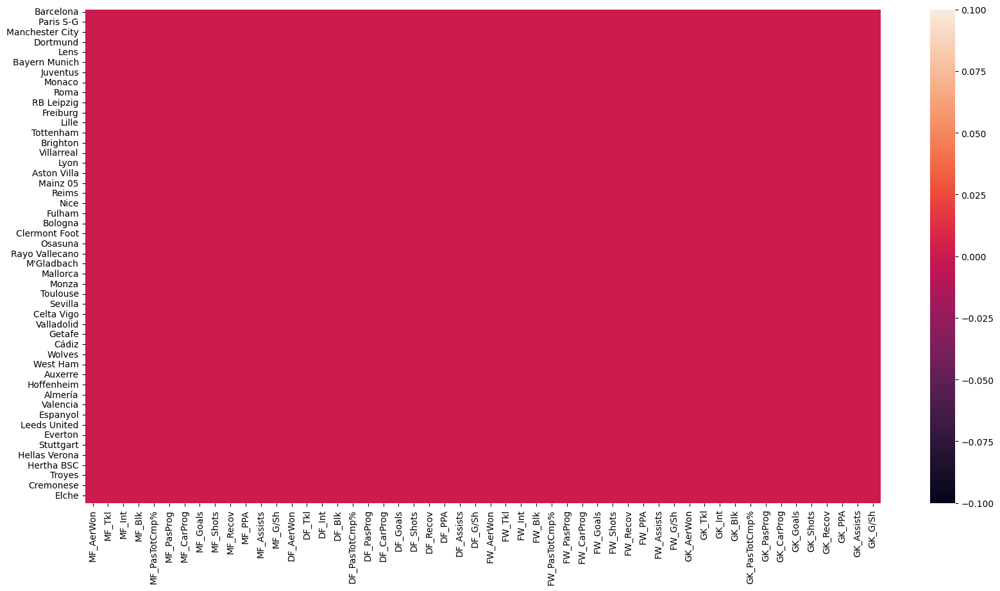

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(aggregated_team_2022.isnull())
plt.show()


2. make the aggregate datasets for different years
3. format teh teams dataset to have only the columns that are to be predicted.
4. combine the  aggregated datasets with the teams dataset
5. use this for prediction
6. make the flow to:
   * select players for different positions
   * aggregate the data
   * use the player stat vector for both teams to predict team stats
   * compare team stats to give win probability

create dummy data and train on that

In [ ]:
# Check for missing values in the player dataset
missing_player_data = player_data_2021.isnull().sum()
print("Missing values in the original player dataset:")
print(missing_player_data[missing_player_data > 0])


Missing values in the original player dataset:
Nation    1
Age       1
dtype: int64


In [ ]:
# Check for missing values in the player dataset
missing_player_data = player_data_2022.isnull().sum()
print("Missing values in the original player dataset:")
print(missing_player_data[missing_player_data > 0])


Missing values in the original player dataset:
Nation    1
dtype: int64


In [ ]:
gkmf_players = player_data_2021[player_data_2021['Pos'] == 'GKMF']
print("Players with position 'GKMF':")
print(gkmf_players)


Players with position 'GKMF':
Empty DataFrame
Columns: [Rk, Player, Nation, Pos, Squad, Comp, Age, Born, MP, Starts, Min, 90s, Goals, Shots, SoT, SoT%, G/Sh, G/SoT, ShoDist, ShoFK, ShoPK, PKatt, PasTotCmp, PasTotAtt, PasTotCmp%, PasTotDist, PasTotPrgDist, PasShoCmp, PasShoAtt, PasShoCmp%, PasMedCmp, PasMedAtt, PasMedCmp%, PasLonCmp, PasLonAtt, PasLonCmp%, Assists, PasAss, Pas3rd, PPA, CrsPA, PasProg, PasAtt, PasLive, PasDead, PasFK, TB, PasPress, Sw, PasCrs, CK, CkIn, CkOut, CkStr, PasGround, PasLow, PasHigh, PaswLeft, PaswRight, PaswHead, TI, PaswOther, PasCmp, PasOff, PasOut, PasInt, PasBlocks, SCA, ScaPassLive, ScaPassDead, ScaDrib, ScaSh, ScaFld, ScaDef, GCA, GcaPassLive, GcaPassDead, GcaDrib, GcaSh, GcaFld, GcaDef, Tkl, TklWon, TklDef3rd, TklMid3rd, TklAtt3rd, TklDri, TklDriAtt, TklDri%, TklDriPast, Press, PresSucc, Press%, PresDef3rd, PresMid3rd, PresAtt3rd, Blocks, BlkSh, BlkShSv, BlkPass, ...]
Index: []

[0 rows x 143 columns]


In [ ]:
aggregated_player_data_2021 = aggregated_team_2021.reset_index()  # Replace with actual aggregated data
aggregated_player_data_2022 = aggregated_team_2022.reset_index()  # Replace with actual aggregated data

aggregated_player_data_2021.rename(columns={'index': 'Squad'}, inplace=True)
aggregated_player_data_2022.rename(columns={'index': 'Squad'}, inplace=True)

# Step 1: Select important columns from teams data
important_columns = ['Squad', 'MP', 'W', 'D', 'L', 'GF', 'GA', 'Pts', 'xG', 'xGA']
teams_data_2021 = team_data_2021[important_columns]
teams_data_2022 = team_data_2022[important_columns]

# Step 2: Merge with aggregated player data
merged_data_2021 = pd.merge(aggregated_player_data_2021, teams_data_2021, on='Squad', how='inner')
merged_data_2022 = pd.merge(aggregated_player_data_2022, teams_data_2022, on='Squad', how='inner')

merged_data_2021['Year'] = 2021
merged_data_2022['Year'] = 2022

# Step 3: Combine data for both years
combined_data = pd.concat([merged_data_2021, merged_data_2022], axis=0, ignore_index=True)

# Verify the combined data
print("Combined data shape:", combined_data.shape)
print("Sample data:")
combined_data.head()


Combined data shape: (196, 63)
Sample data:


,Squad,DF_AerWon,DF_Tkl,DF_Int,DF_Blk,DF_PasTotCmp%,DF_PasProg,DF_CarProg,DF_Goals,DF_Shots,...,MP,W,D,L,GF,GA,Pts,xG,xGA,Year
0,Manchester City,18.77,13.83,10.51,7.54,90.988889,46.14,69.04,0.50,6.70,...,38,29,6,3,99,26,93,89.0,27.2,2021
1,Liverpool,17.85,9.95,14.88,8.61,84.912500,40.48,64.03,0.36,5.83,...,38,28,8,2,94,26,92,89.2,34.2,2021
2,Bayern Munich,17.36,25.28,21.03,20.77,87.820000,51.93,58.65,0.38,7.01,...,34,24,5,5,97,37,77,88.1,37.1,2021
3,Paris S-G,20.36,17.65,14.02,23.43,93.618182,51.16,62.25,0.68,4.23,...,38,26,8,4,90,36,86,76.5,38.6,2021
4,Real Madrid,10.36,18.40,21.65,15.50,89.754545,38.26,54.77,0.58,5.95,...,38,26,8,4,80,31,86,74.3,47.0,2021


In [ ]:
combined_data

,Squad,DF_AerWon,DF_Tkl,DF_Int,DF_Blk,DF_PasTotCmp%,DF_PasProg,DF_CarProg,DF_Goals,DF_Shots,...,MP,W,D,L,GF,GA,Pts,xG,xGA,Year
0,Manchester City,18.77,13.83,10.51,7.54,90.988889,46.14,69.04,0.50,6.70,...,38,29,6,3,99,26,93,89.0,27.2,2021
1,Liverpool,17.85,9.95,14.88,8.61,84.912500,40.48,64.03,0.36,5.83,...,38,28,8,2,94,26,92,89.2,34.2,2021
2,Bayern Munich,17.36,25.28,21.03,20.77,87.820000,51.93,58.65,0.38,7.01,...,34,24,5,5,97,37,77,88.1,37.1,2021
3,Paris S-G,20.36,17.65,14.02,23.43,93.618182,51.16,62.25,0.68,4.23,...,38,26,8,4,90,36,86,76.5,38.6,2021
4,Real Madrid,10.36,18.40,21.65,15.50,89.754545,38.26,54.77,0.58,5.95,...,38,26,8,4,80,31,86,74.3,47.0,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Ajaccio,13.86,14.03,12.30,7.78,79.200000,31.49,19.10,1.00,3.43,...,31,6,3,22,22,58,21,34.2,42.6,2022
192,Cremonese,18.93,32.39,16.04,17.39,71.161538,42.86,18.11,3.00,8.34,...,30,3,10,17,27,54,19,31.7,53.7,2022
193,Sampdoria,15.83,21.60,10.26,13.15,75.918182,34.37,10.33,2.00,5.06,...,31,3,8,20,20,52,17,27.8,51.3,2022
194,Elche,14.95,17.85,13.09,10.35,73.733333,22.25,13.73,3.00,5.39,...,29,2,7,20,20,59,13,25.5,56.7,2022


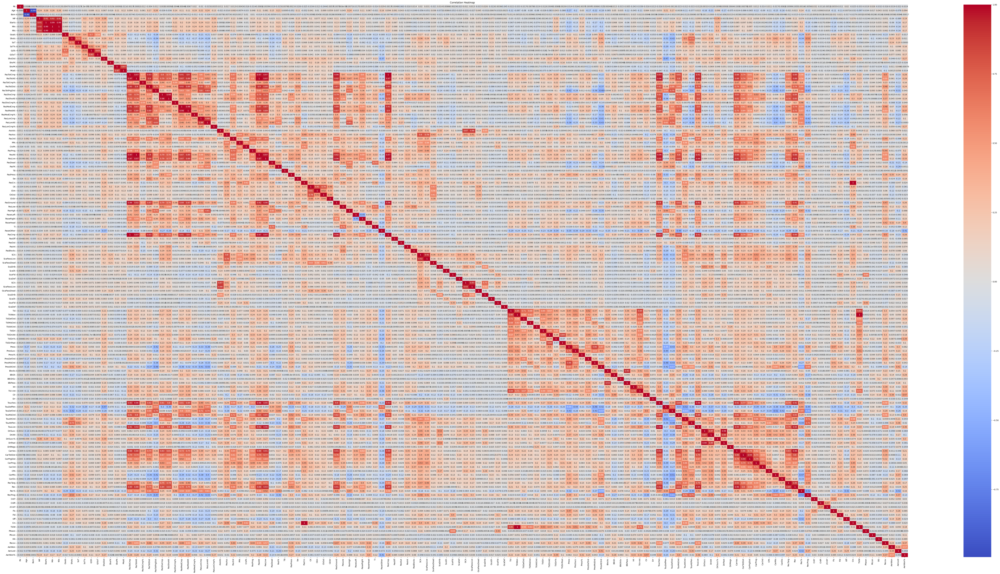

In [ ]:
numeric_df = player_data_2021.select_dtypes(include=[np.number])
plt.figure(figsize=(100, 50))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#Pairs with high colrealtion
correlation_matrix = numeric_df.corr()

# Function to create sorted unique pairs with their correlation values
def get_unique_pairs_with_values(corr_matrix, threshold_low, threshold_high):
    pairs = []
    for i in range(corr_matrix.shape[0]):
        for j in range(i + 1, corr_matrix.shape[1]):  # Only check upper triangle
            corr_value = corr_matrix.iloc[i, j]
            if threshold_low < corr_value < threshold_high:
                pairs.append((corr_matrix.index[i], corr_matrix.columns[j], corr_value))
    return pairs

# Find pairs with correlation > 0.9
high_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, 0.75, 1.0)

# Find pairs with correlation < -0.9
low_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, -1.0, -0.75)

# Display results
print("Pairs with correlation > 0.75:")
for col1, col2, corr_value in high_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(high_correlation_pairs)}")

print("\nPairs with correlation < -0.75:")
for col1, col2, corr_value in low_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(low_correlation_pairs)}")

Pairs with correlation > 0.75:
 - MP and Starts: 0.91
 - MP and Min: 0.92
 - MP and 90s: 0.92
 - Starts and Min: 0.99
 - Starts and 90s: 0.99
 - Min and 90s: 1.00
 - G/Sh and G/SoT: 0.83
 - ShoPK and PKatt: 0.87
 - PasTotCmp and PasTotAtt: 0.97
 - PasTotCmp and PasTotDist: 0.93
 - PasTotCmp and PasShoCmp: 0.80
 - PasTotCmp and PasShoAtt: 0.75
 - PasTotCmp and PasMedCmp: 0.91
 - PasTotCmp and PasMedAtt: 0.90
 - PasTotCmp and PasAtt: 0.97
 - PasTotCmp and PasLive: 0.97
 - PasTotCmp and PasGround: 0.96
 - PasTotCmp and Touches: 0.93
 - PasTotCmp and TouMid3rd: 0.81
 - PasTotCmp and TouLive: 0.91
 - PasTotCmp and Carries: 0.88
 - PasTotCmp and Rec: 0.89
 - PasTotAtt and PasTotDist: 0.90
 - PasTotAtt and PasShoCmp: 0.79
 - PasTotAtt and PasShoAtt: 0.76
 - PasTotAtt and PasMedCmp: 0.87
 - PasTotAtt and PasMedAtt: 0.89
 - PasTotAtt and PasLive: 0.97
 - PasTotAtt and PasGround: 0.92
 - PasTotAtt and PasCmp: 0.97
 - PasTotAtt and Touches: 0.96
 - PasTotAtt and TouMid3rd: 0.80
 - PasTotAtt and T

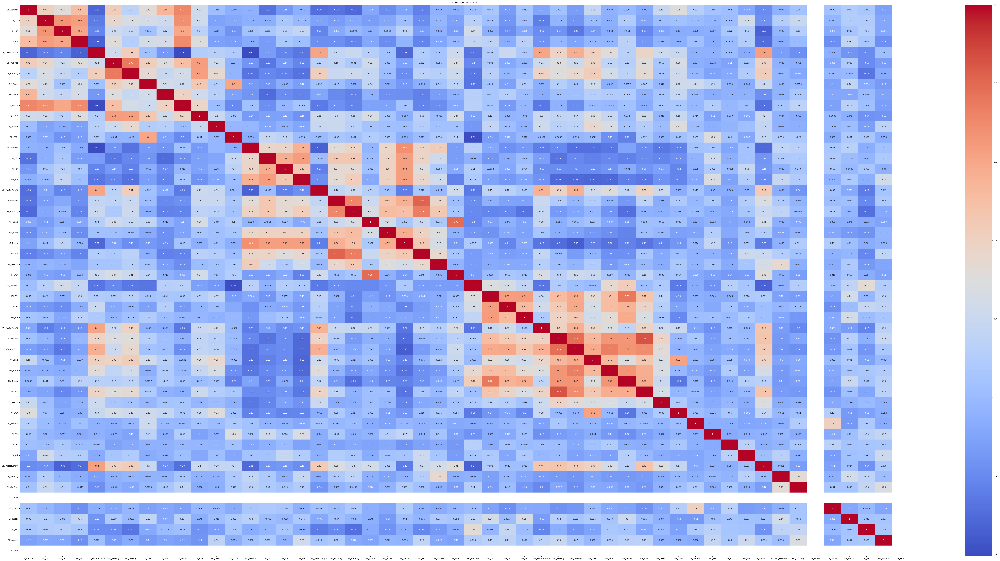

In [ ]:
numeric_df = aggregated_player_data_2021.select_dtypes(include=[np.number])
plt.figure(figsize=(100, 50))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#Pairs with high colrealtion
correlation_matrix = numeric_df.corr()

# Function to create sorted unique pairs with their correlation values
def get_unique_pairs_with_values(corr_matrix, threshold_low, threshold_high):
    pairs = []
    for i in range(corr_matrix.shape[0]):
        for j in range(i + 1, corr_matrix.shape[1]):  # Only check upper triangle
            corr_value = corr_matrix.iloc[i, j]
            if threshold_low < corr_value < threshold_high:
                pairs.append((corr_matrix.index[i], corr_matrix.columns[j], corr_value))
    return pairs

# Find pairs with correlation > 0.9
high_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, 0.75, 1.0)

# Find pairs with correlation < -0.9
low_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, -1.0, -0.75)

# Display results
print("Pairs with correlation > 0.75:")
for col1, col2, corr_value in high_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(high_correlation_pairs)}")

print("\nPairs with correlation < -0.75:")
for col1, col2, corr_value in low_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(low_correlation_pairs)}")

Pairs with correlation > 0.75:
 - DF_PasProg and DF_CarProg: 0.75
 - MF_PasProg and MF_PPA: 0.82
 - MF_Goals and MF_G/Sh: 0.79
 - FW_Tkl and FW_Recov: 0.76
 - FW_PasProg and FW_CarProg: 0.79
 - FW_PasProg and FW_PPA: 0.86
Total count: 6

Pairs with correlation < -0.75:
Total count: 0


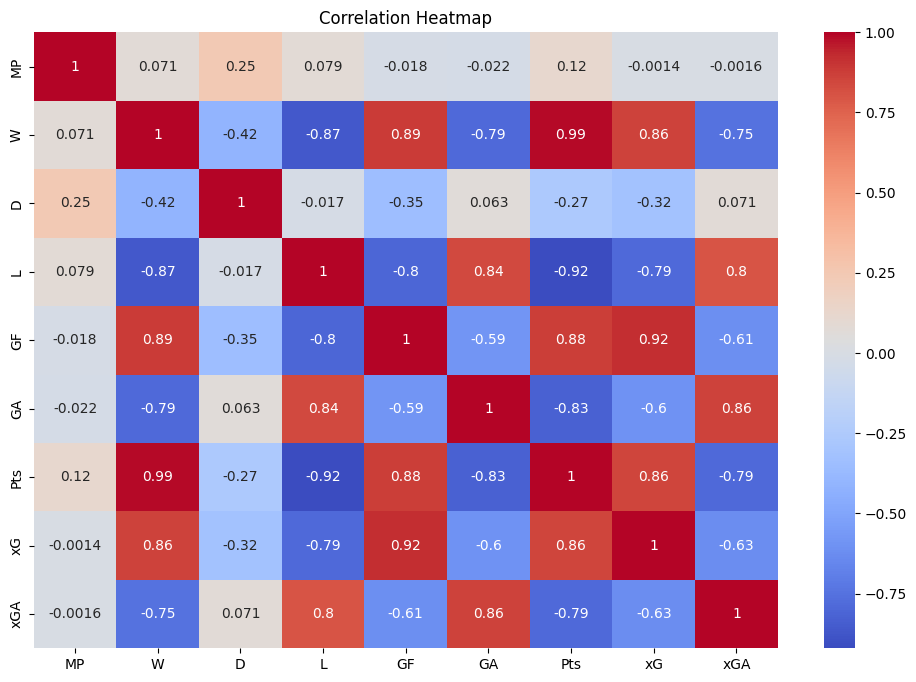

In [ ]:
numeric_df = teams_data_2021.select_dtypes(include=[np.number])
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#Pairs with high colrealtion
correlation_matrix = numeric_df.corr()

# Function to create sorted unique pairs with their correlation values
def get_unique_pairs_with_values(corr_matrix, threshold_low, threshold_high):
    pairs = []
    for i in range(corr_matrix.shape[0]):
        for j in range(i + 1, corr_matrix.shape[1]):  # Only check upper triangle
            corr_value = corr_matrix.iloc[i, j]
            if threshold_low < corr_value < threshold_high:
                pairs.append((corr_matrix.index[i], corr_matrix.columns[j], corr_value))
    return pairs

# Find pairs with correlation > 0.9
high_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, 0.75, 1.0)

# Find pairs with correlation < -0.9
low_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, -1.0, -0.75)

# Display results
print("Pairs with correlation > 0.75:")
for col1, col2, corr_value in high_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(high_correlation_pairs)}")

print("\nPairs with correlation < -0.75:")
for col1, col2, corr_value in low_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(low_correlation_pairs)}")

Pairs with correlation > 0.75:
 - W and GF: 0.89
 - W and Pts: 0.99
 - W and xG: 0.86
 - L and GA: 0.84
 - L and xGA: 0.80
 - GF and Pts: 0.88
 - GF and xG: 0.92
 - GA and xGA: 0.86
 - Pts and xG: 0.86
Total count: 9

Pairs with correlation < -0.75:
 - W and L: -0.87
 - W and GA: -0.79
 - W and xGA: -0.75
 - L and GF: -0.80
 - L and Pts: -0.92
 - L and xG: -0.79
 - GA and Pts: -0.83
 - Pts and xGA: -0.79
Total count: 8


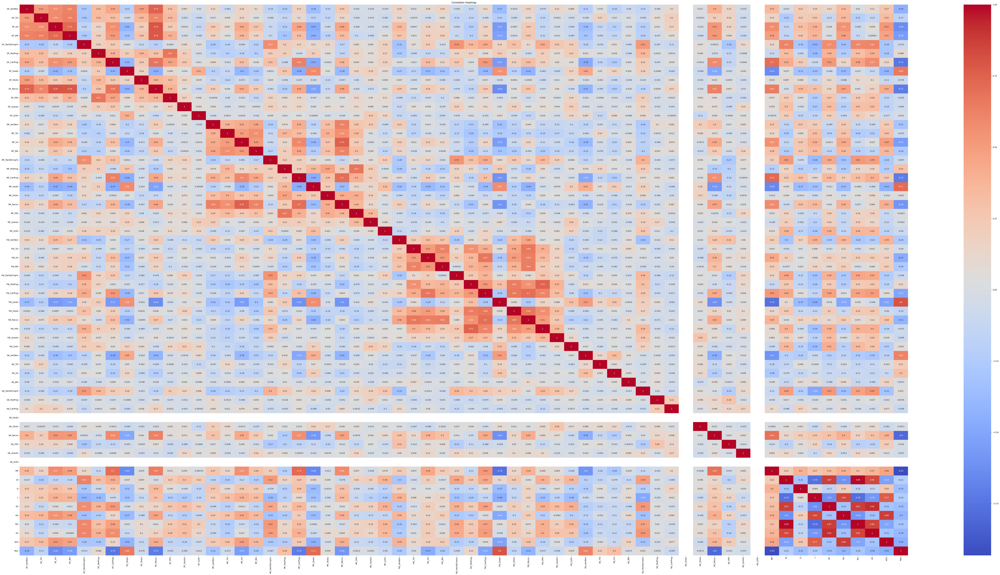

In [ ]:
numeric_df = combined_data.select_dtypes(include=[np.number])
plt.figure(figsize=(100, 50))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#Pairs with high colrealtion
correlation_matrix = numeric_df.corr()

# Function to create sorted unique pairs with their correlation values
def get_unique_pairs_with_values(corr_matrix, threshold_low, threshold_high):
    pairs = []
    for i in range(corr_matrix.shape[0]):
        for j in range(i + 1, corr_matrix.shape[1]):  # Only check upper triangle
            corr_value = corr_matrix.iloc[i, j]
            if threshold_low < corr_value < threshold_high:
                pairs.append((corr_matrix.index[i], corr_matrix.columns[j], corr_value))
    return pairs

# Find pairs with correlation > 0.9
high_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, 0.75, 1.0)

# Find pairs with correlation < -0.9
low_correlation_pairs = get_unique_pairs_with_values(correlation_matrix, -1.0, -0.75)

# Display results
print("Pairs with correlation > 0.75:")
for col1, col2, corr_value in high_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(high_correlation_pairs)}")

print("\nPairs with correlation < -0.75:")
for col1, col2, corr_value in low_correlation_pairs:
    print(f" - {col1} and {col2}: {corr_value:.2f}")
print(f"Total count: {len(low_correlation_pairs)}")

Pairs with correlation > 0.75:
 - DF_Int and DF_Recov: 0.79
 - DF_Blk and DF_Recov: 0.78
 - MF_Int and MF_Recov: 0.75
 - FW_Goals and Year: 0.80
 - W and GF: 0.87
 - W and Pts: 0.99
 - W and xG: 0.84
 - L and GA: 0.84
 - L and xGA: 0.77
 - GF and Pts: 0.87
 - GF and xG: 0.92
 - GA and xGA: 0.88
 - Pts and xG: 0.85
Total count: 13

Pairs with correlation < -0.75:
 - FW_Goals and MP: -0.76
 - GK_Recov and Year: -0.80
 - MP and Year: -0.93
 - W and L: -0.76
 - L and Pts: -0.78
Total count: 5


In [ ]:
fig = px.scatter(new_combined_data, x='FW_AerWon', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='FW_Tkl', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='FW_PasTotCmp%', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='FW_Goals', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='GK_PPA', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='GK_PasProg', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='GK_PasTotCmp%', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='DF_PasProg', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='DF_CarProg', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='GF', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

In [ ]:
fig = px.scatter(new_combined_data, x='xG', y='Wp', color='GF',
                 size='GF', hover_data=['W', 'L', 'D', 'Squad'],
                 title="Scatter Plot")
fig.show()

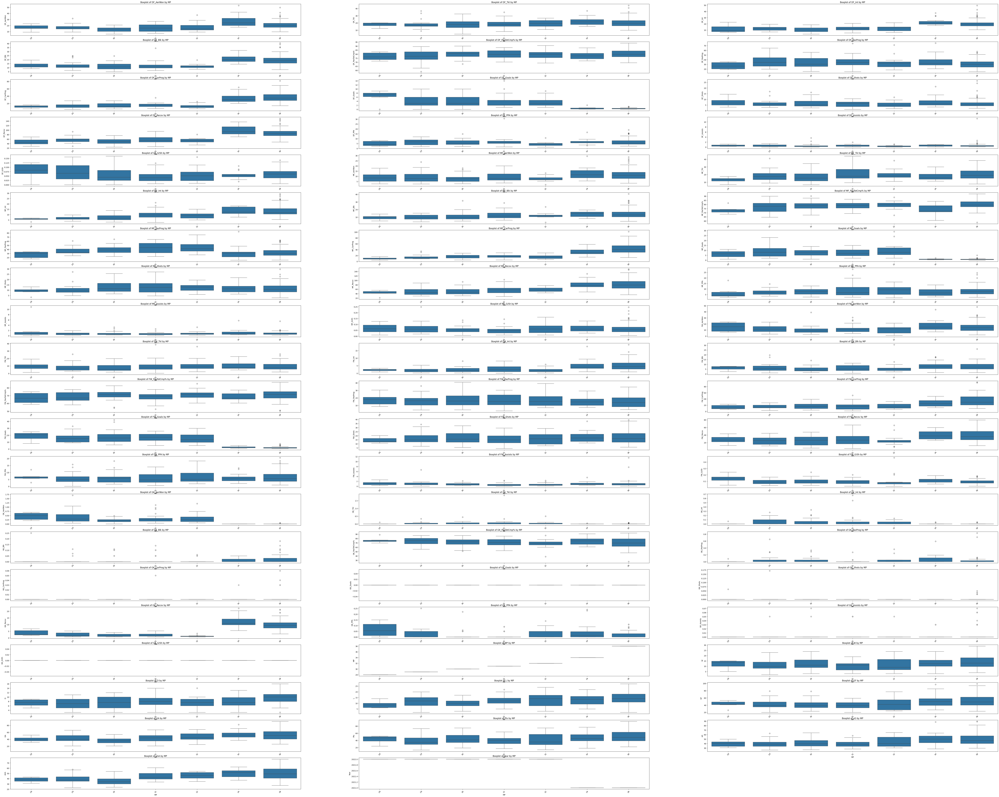

In [ ]:

numeric_df = combined_data.select_dtypes(include=[np.number])
# Calculate the number of rows and columns for the subplot grid
num_plots = len(numeric_df.columns)
num_cols = 3  # You can adjust this if needed
num_rows = int(np.ceil(num_plots / num_cols))

# Create the figure and axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(100, 80))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through the numeric columns and create boxplots
for i, column in enumerate(numeric_df.columns):
    ax = axes[i]  # Get the current subplot axis
    sns.boxplot(x='MP', y=column, data=combined_data, ax=ax)
    ax.set_title(f'Boxplot of {column} by MP')
    ax.tick_params(axis='x', rotation=45)

# Hide any unused subplots (if num_plots is not a multiple of num_cols)
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)
plt.show()